# **BAYBAYIN CHARACTER CLASSIFICATION**

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

#DATA PREPARATION

In [2]:
import cv2
import os.path
import imutils
from imutils import paths

In [3]:
IMG_SIZE = 32

In [4]:
def resize_to_fit(image, char_size, img_size):
    """
    A helper function to resize an image to fit within a given size
    :param image: image to resize
    :param width: desired width in pixels
    :param height: desired height in pixels
    :return: the resized image
    """

    # grab the dimensions of the image, then initialize
    # the padding values
    (h, w) = image.shape[:2]

    # if the width is greater than the height then resize along
    # the width
    if w > h:
        image = imutils.resize(image, width=char_size)

    # otherwise, the height is greater than the width so resize
    # along the height
    else:
        image = imutils.resize(image, height=char_size)

    # determine the padding values for the width and height to
    # obtain the target dimensions
    padW = int((img_size - image.shape[1]) / 2.0)
    padH = int((img_size - image.shape[0]) / 2.0)

    # pad the image then apply one more resizing to handle any
    # rounding issues
    image = cv2.copyMakeBorder(image, padH, padH, padW, padW,
        cv2.BORDER_CONSTANT,value=[255,255,255])
    image = cv2.resize(image, (img_size, img_size))

    # return the pre-processed image
    return image

In [5]:
def dataset_read(data_dir):
    # initialize the data and labels
    data = []
    labels = []

    # loop over the input images
    for image_file in paths.list_images(data_dir):
        # Load the image and convert it to grayscale
        image = cv2.imread(image_file)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

        # Resize the letter so it fits in a 20x20 pixel box
        image = resize_to_fit(image, 23, IMG_SIZE)

        # Add a third channel dimension to the image to make Keras happy
        #image = image[np.newaxis]
        #image = np.expand_dims(image,3)
        image = np.expand_dims(image,axis=2)

        # Grab the name of the letter based on the folder it was in
        label = image_file.split(os.path.sep)[-1]
        if label.find("_")>0:
            labeli = label.find("_")
        else:
            labeli = label.find(".")
        label = label[0:labeli]
        label = label.casefold()

        # Add the letter image and it's label to our training data
        data.append(image)
        labels.append(label)

    return data, labels

In [6]:
def get_dataset_size(labels):
    dataset_size = np.unique(labels, return_counts=True)

    fig = plt.figure()
    ax = fig.add_axes([0,0,1,1])
    ax.bar(dataset_size[0],dataset_size[1])
    plt.show()

    print(dataset_size)

    return dataset_size

In [7]:
# Visualize the dataset

import random

def show_dataset_samples(data,labels):
    plt.rcParams['figure.figsize'] = [12, 8]

    count = 8
    fig, ax = plt.subplots(count, count)
    for i in range(count):
        for j in range(count):
            k = random.randint(0,len(labels))
            ax[i][j].imshow(np.reshape(data[k],(IMG_SIZE,IMG_SIZE)), aspect='auto', cmap='gray')
            ax[i][j].title.set_text(labels[k])
            ax[i][j].axis('off')
    
    plt.show()

    return

##IMPORTING DATASETS

###DATASET1

In [8]:
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [9]:
!kaggle datasets download 'jamesnogra/baybayn-baybayin-handwritten-images'

 97% 9.00M/9.29M [00:00<00:00, 90.4MB/s]
100% 9.29M/9.29M [00:00<00:00, 88.4MB/s]


In [10]:
from zipfile import ZipFile

data_dir = 'baybayn-baybayin-handwritten-images.zip'
data_dir_new = 'baybayin-char-dataset1'

with ZipFile(data_dir, 'r') as zipObj:
   listOfFileNames = zipObj.namelist()
   for fileName in listOfFileNames:
       if fileName.endswith('.jpg'):
           # Extract a single file from zipfile import ZipFile
           zipObj.extract(fileName, data_dir_new)
   print('All the images are extracted')

All the images are extracted


In [11]:
# initialize the data and labels
data1, labels1 = dataset_read(data_dir_new)

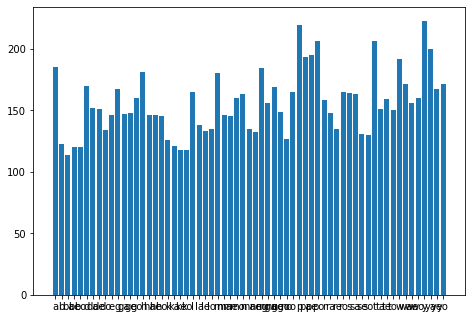

(array(['a', 'b', 'ba', 'be', 'bo', 'd', 'da', 'de', 'do', 'e', 'g', 'ga',
       'ge', 'go', 'h', 'ha', 'he', 'ho', 'k', 'ka', 'ke', 'ko', 'l',
       'la', 'le', 'lo', 'm', 'ma', 'me', 'mo', 'n', 'na', 'ne', 'ng',
       'nga', 'nge', 'ngo', 'no', 'o', 'p', 'pa', 'pe', 'po', 'r', 'ra',
       're', 'ro', 's', 'sa', 'se', 'so', 't', 'ta', 'te', 'to', 'w',
       'wa', 'we', 'wo', 'y', 'ya', 'ye', 'yo'], dtype='<U3'), array([185, 123, 114, 120, 120, 170, 152, 151, 134, 146, 167, 147, 148,
       160, 181, 146, 146, 145, 126, 121, 118, 118, 165, 138, 133, 135,
       180, 146, 145, 160, 163, 135, 132, 184, 156, 169, 149, 127, 165,
       219, 193, 195, 206, 158, 148, 135, 165, 164, 163, 131, 130, 206,
       151, 159, 150, 192, 171, 156, 160, 223, 200, 167, 171]))


In [12]:
dataset1_size = get_dataset_size(labels1)

In [13]:
num_classes1 = len(dataset1_size[1])
num_classes1

63

In [14]:
np.shape(data1[1])

(32, 32, 1)

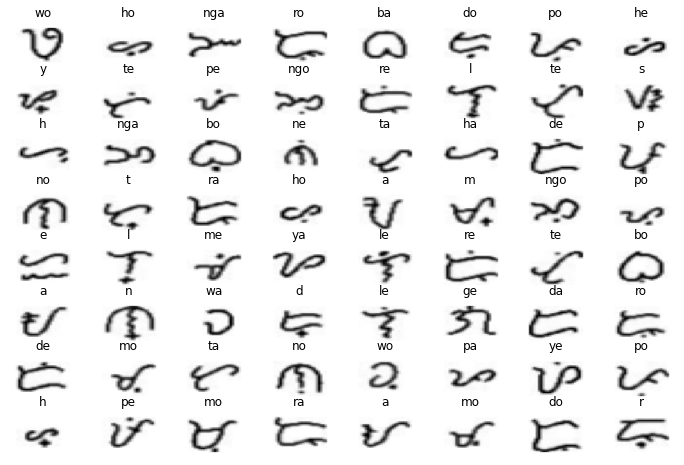

In [15]:
show_dataset_samples(data1,labels1)

###DATASET2

In [16]:
import requests

url = 'https://md-datasets-cache-zipfiles-prod.s3.eu-west-1.amazonaws.com/j6cgcfys77-1.zip'
r = requests.get(url, allow_redirects=True)

open('j6cgcfys77-1.zip', 'wb').write(r.content)

117883750

In [17]:
!unzip 'j6cgcfys77-1.zip'

Archive:  j6cgcfys77-1.zip
  inflating: Baybayin Symbol Dataset.zip  


In [18]:
!unzip 'Baybayin Symbol Dataset.zip'

Streaming output truncated to the last 5000 lines.
  inflating: original/ta/ta_01840_file138.jpg  
  inflating: original/ta/ta_01841_file139.jpg  
  inflating: original/ta/ta_01842_file139.jpg  
  inflating: original/ta/ta_01843_file139.jpg  
  inflating: original/ta/ta_01844_file139.jpg  
  inflating: original/ta/ta_01845_file140.jpg  
  inflating: original/ta/ta_01846_file140.jpg  
  inflating: original/ta/ta_01847_file140.jpg  
 extracting: original/ta/ta_01848_file142.jpg  
 extracting: original/ta/ta_01849_file142.jpg  
 extracting: original/ta/ta_01850_file142.jpg  
 extracting: original/ta/ta_01851_file142.jpg  
 extracting: original/ta/ta_01852_file143.jpg  
 extracting: original/ta/ta_01853_file143.jpg  
  inflating: original/ta/ta_01854_file144.jpg  
  inflating: original/ta/ta_01855_file146.jpg  
 extracting: original/ta/ta_01856_file146.jpg  
  inflating: original/ta/ta_01857_file146.jpg  
 extracting: original/ta/ta_01858_file146.jpg  
  inflating: original/ta/ta_01859_fil

In [19]:
data2, labels2 = dataset_read("original")

In [20]:
# rename label name 'dara' to 'da'
for i in range(len(labels2)):
    if labels2[i] == 'dara':
      labels2[i] = 'da'
    if labels2[i] == 'ei':
      labels2[i] = 'e'
    if labels2[i] == 'ou':
      labels2[i] = 'o'

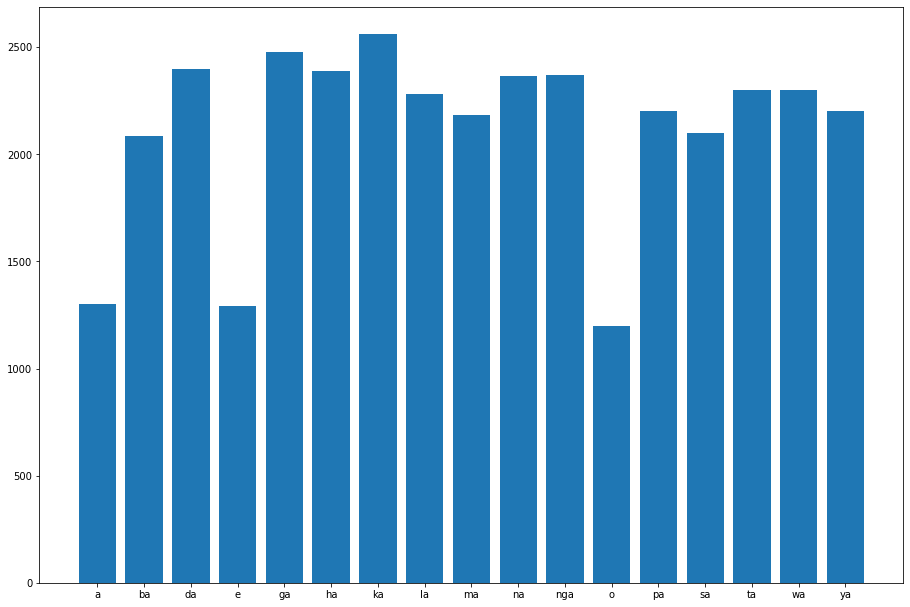

(array(['a', 'ba', 'da', 'e', 'ga', 'ha', 'ka', 'la', 'ma', 'na', 'nga',
       'o', 'pa', 'sa', 'ta', 'wa', 'ya'], dtype='<U3'), array([1300, 2085, 2400, 1290, 2475, 2390, 2560, 2280, 2185, 2365, 2370,
       1200, 2200, 2100, 2300, 2300, 2200]))


In [21]:
dataset2_size = get_dataset_size(labels2)

In [22]:
num_classes2 = len(dataset2_size[1])
num_classes2

17

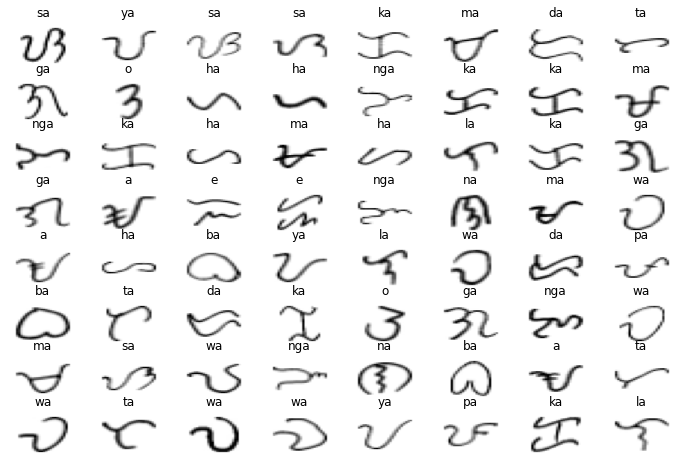

In [23]:
show_dataset_samples(data2,labels2)

###COMBINED DATASET

In [24]:
data = []
labels = []
data = np.concatenate((data1, data2), axis=0)
labels = np.concatenate((labels1, labels2), axis=0)

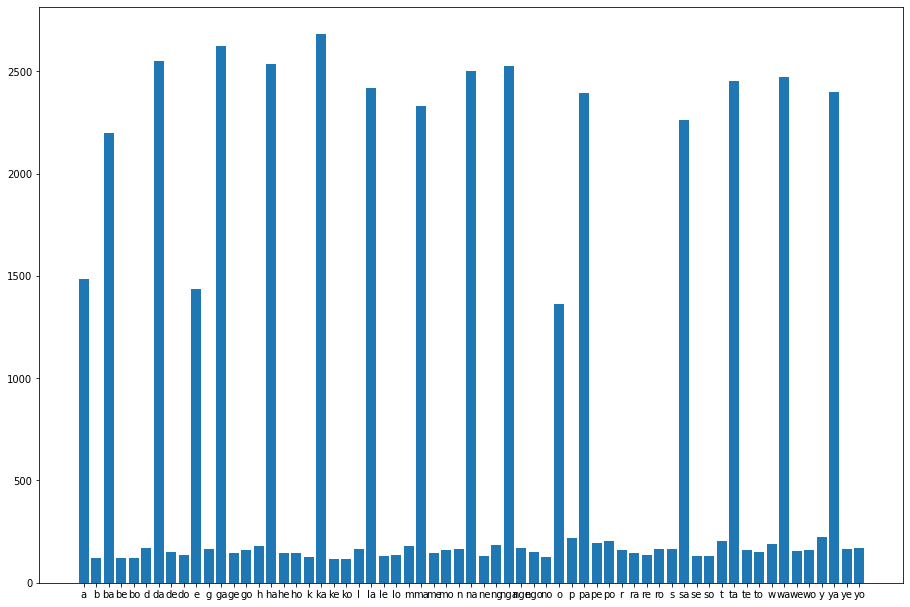

(array(['a', 'b', 'ba', 'be', 'bo', 'd', 'da', 'de', 'do', 'e', 'g', 'ga',
       'ge', 'go', 'h', 'ha', 'he', 'ho', 'k', 'ka', 'ke', 'ko', 'l',
       'la', 'le', 'lo', 'm', 'ma', 'me', 'mo', 'n', 'na', 'ne', 'ng',
       'nga', 'nge', 'ngo', 'no', 'o', 'p', 'pa', 'pe', 'po', 'r', 'ra',
       're', 'ro', 's', 'sa', 'se', 'so', 't', 'ta', 'te', 'to', 'w',
       'wa', 'we', 'wo', 'y', 'ya', 'ye', 'yo'], dtype='<U3'), array([1485,  123, 2199,  120,  120,  170, 2552,  151,  134, 1436,  167,
       2622,  148,  160,  181, 2536,  146,  145,  126, 2681,  118,  118,
        165, 2418,  133,  135,  180, 2331,  145,  160,  163, 2500,  132,
        184, 2526,  169,  149,  127, 1365,  219, 2393,  195,  206,  158,
        148,  135,  165,  164, 2263,  131,  130,  206, 2451,  159,  150,
        192, 2471,  156,  160,  223, 2400,  167,  171]))


In [25]:
dataset_size = get_dataset_size(labels)

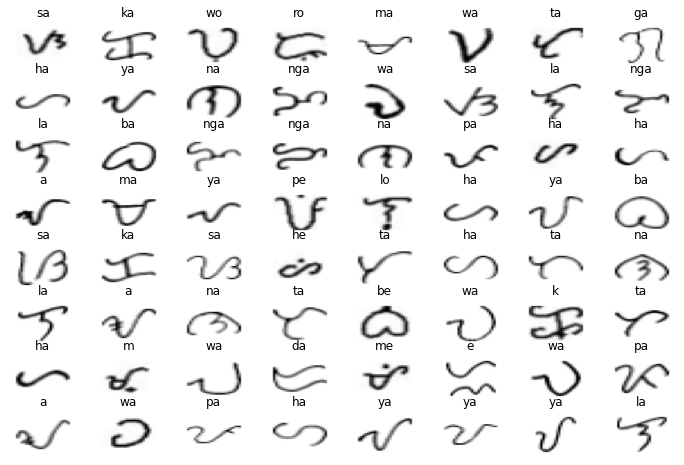

In [26]:
show_dataset_samples(data,labels)

##Preparing TRAIN & VALID Dataset

In [27]:
from sklearn.model_selection import train_test_split
(train_data, valid_data, train_label, valid_label) = train_test_split(data, labels, test_size=0.2, random_state=0
                                                                      #shuffle = True, stratify=labels
                                                                      )

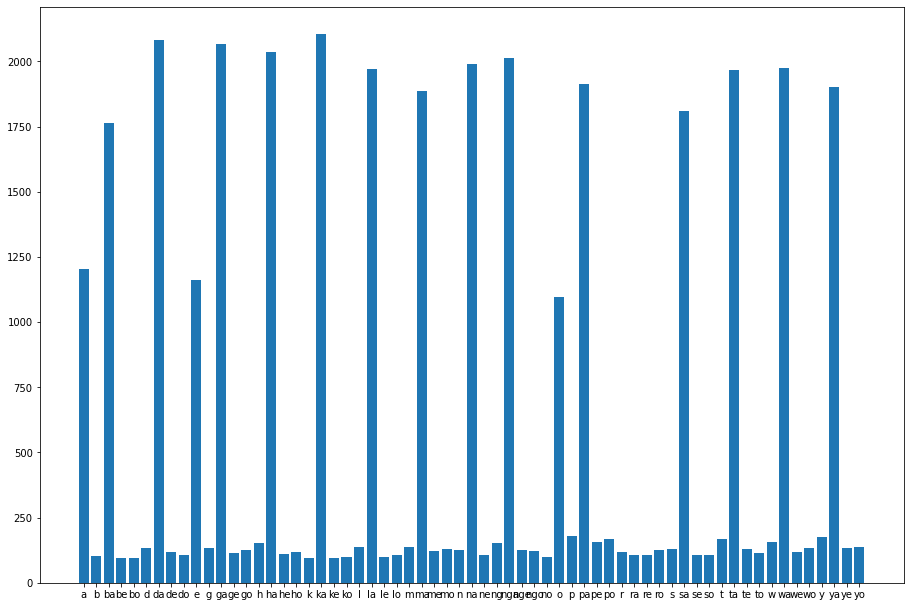

(array(['a', 'b', 'ba', 'be', 'bo', 'd', 'da', 'de', 'do', 'e', 'g', 'ga',
       'ge', 'go', 'h', 'ha', 'he', 'ho', 'k', 'ka', 'ke', 'ko', 'l',
       'la', 'le', 'lo', 'm', 'ma', 'me', 'mo', 'n', 'na', 'ne', 'ng',
       'nga', 'nge', 'ngo', 'no', 'o', 'p', 'pa', 'pe', 'po', 'r', 'ra',
       're', 'ro', 's', 'sa', 'se', 'so', 't', 'ta', 'te', 'to', 'w',
       'wa', 'we', 'wo', 'y', 'ya', 'ye', 'yo'], dtype='<U3'), array([1204,  101, 1764,   95,   96,  134, 2081,  120,  105, 1161,  132,
       2068,  115,  126,  153, 2035,  111,  119,   94, 2104,   96,   99,
        136, 1972,   98,  107,  137, 1885,  123,  129,  125, 1991,  108,
        152, 2011,  125,  121,  100, 1097,  180, 1913,  157,  169,  119,
        108,  105,  126,  129, 1809,  105,  107,  169, 1967,  128,  115,
        155, 1974,  120,  133,  177, 1902,  132,  137]))


In [28]:
train_datasize = get_dataset_size(train_label)

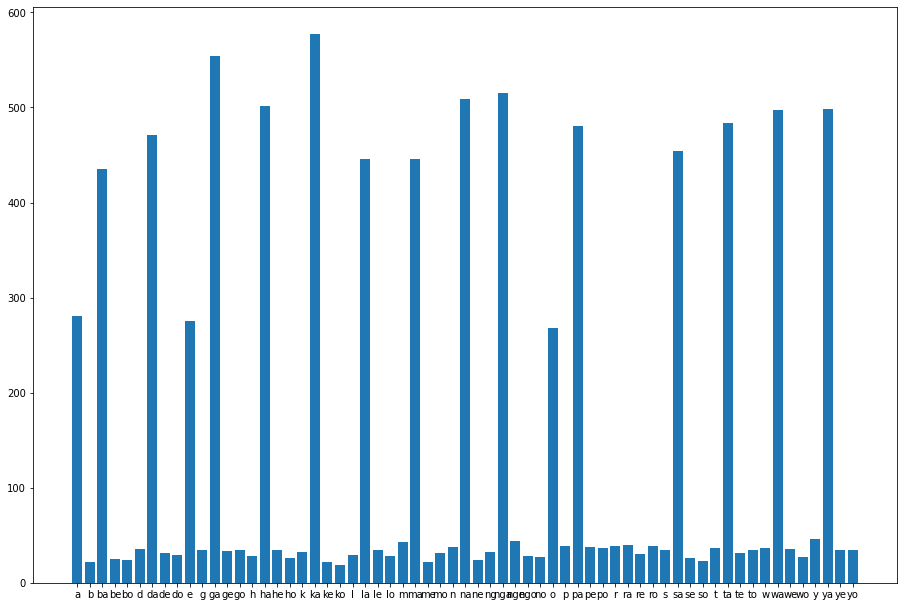

(array(['a', 'b', 'ba', 'be', 'bo', 'd', 'da', 'de', 'do', 'e', 'g', 'ga',
       'ge', 'go', 'h', 'ha', 'he', 'ho', 'k', 'ka', 'ke', 'ko', 'l',
       'la', 'le', 'lo', 'm', 'ma', 'me', 'mo', 'n', 'na', 'ne', 'ng',
       'nga', 'nge', 'ngo', 'no', 'o', 'p', 'pa', 'pe', 'po', 'r', 'ra',
       're', 'ro', 's', 'sa', 'se', 'so', 't', 'ta', 'te', 'to', 'w',
       'wa', 'we', 'wo', 'y', 'ya', 'ye', 'yo'], dtype='<U3'), array([281,  22, 435,  25,  24,  36, 471,  31,  29, 275,  35, 554,  33,
        34,  28, 501,  35,  26,  32, 577,  22,  19,  29, 446,  35,  28,
        43, 446,  22,  31,  38, 509,  24,  32, 515,  44,  28,  27, 268,
        39, 480,  38,  37,  39,  40,  30,  39,  35, 454,  26,  23,  37,
       484,  31,  35,  37, 497,  36,  27,  46, 498,  35,  34]))


In [29]:
valid_datasize = get_dataset_size(valid_label)

###BALANCING DATA
https://www.analyticsvidhya.com/blog/2021/06/5-techniques-to-handle-imbalanced-data-for-a-classification-problem/

In [30]:
from sklearn.utils import resample

def dataset_balancing(data,labels,size):
    dat = []
    lbl = []

    datasize = np.unique(labels, return_counts=True)

    for letter in datasize[0]:
        df = data[(labels==letter)]
        df_sampled = resample(df, 
                              replace=True,    # sample with replacement
                              n_samples= size, # to match majority class
                              random_state=42)
        for i in range(len(df_sampled)):
            dat.append(df_sampled[i])
            #data = np.append(df_sampled[i])
        lbl_sampled = np.repeat(letter,size)
        #labels.append(lbl_sampled)
        lbl = np.concatenate((lbl,lbl_sampled), axis=0)

    dat = np.array(dat)
    lbl = np.array(lbl)

    return dat, lbl

####Train Dataset

In [31]:
train_size = 400
train_data, train_label = dataset_balancing(train_data,train_label,train_size)

In [32]:
train_data.shape

(25200, 32, 32, 1)

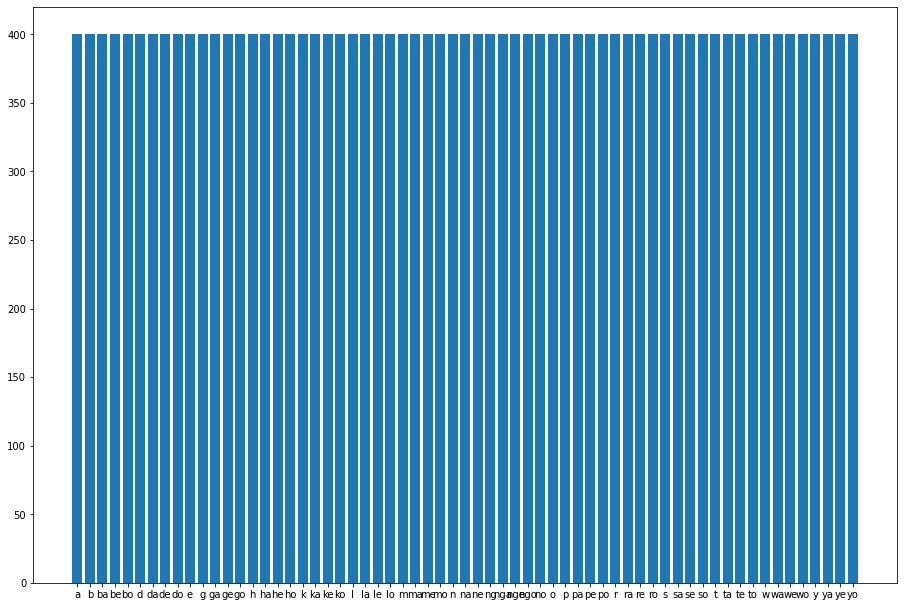

(array(['a', 'b', 'ba', 'be', 'bo', 'd', 'da', 'de', 'do', 'e', 'g', 'ga',
       'ge', 'go', 'h', 'ha', 'he', 'ho', 'k', 'ka', 'ke', 'ko', 'l',
       'la', 'le', 'lo', 'm', 'ma', 'me', 'mo', 'n', 'na', 'ne', 'ng',
       'nga', 'nge', 'ngo', 'no', 'o', 'p', 'pa', 'pe', 'po', 'r', 'ra',
       're', 'ro', 's', 'sa', 'se', 'so', 't', 'ta', 'te', 'to', 'w',
       'wa', 'we', 'wo', 'y', 'ya', 'ye', 'yo'], dtype='<U32'), array([400, 400, 400, 400, 400, 400, 400, 400, 400, 400, 400, 400, 400,
       400, 400, 400, 400, 400, 400, 400, 400, 400, 400, 400, 400, 400,
       400, 400, 400, 400, 400, 400, 400, 400, 400, 400, 400, 400, 400,
       400, 400, 400, 400, 400, 400, 400, 400, 400, 400, 400, 400, 400,
       400, 400, 400, 400, 400, 400, 400, 400, 400, 400, 400]))


In [33]:
train_datasize = get_dataset_size(train_label)

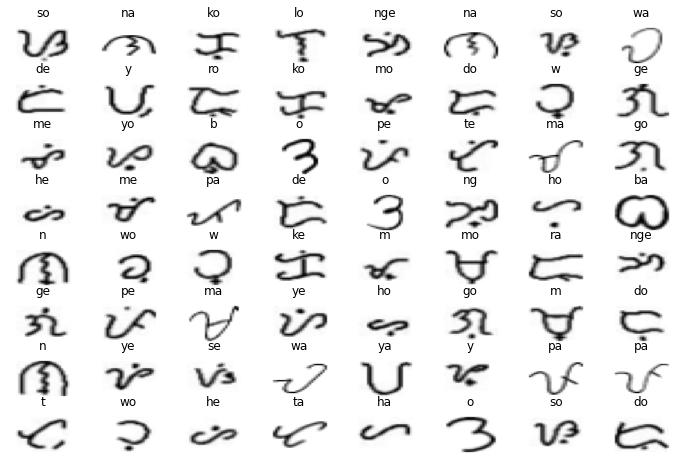

In [34]:
show_dataset_samples(train_data,train_label)

In [35]:
valid_size = 100

valid_data, valid_label = dataset_balancing(valid_data,valid_label,valid_size)

In [36]:
valid_data.shape

(6300, 32, 32, 1)

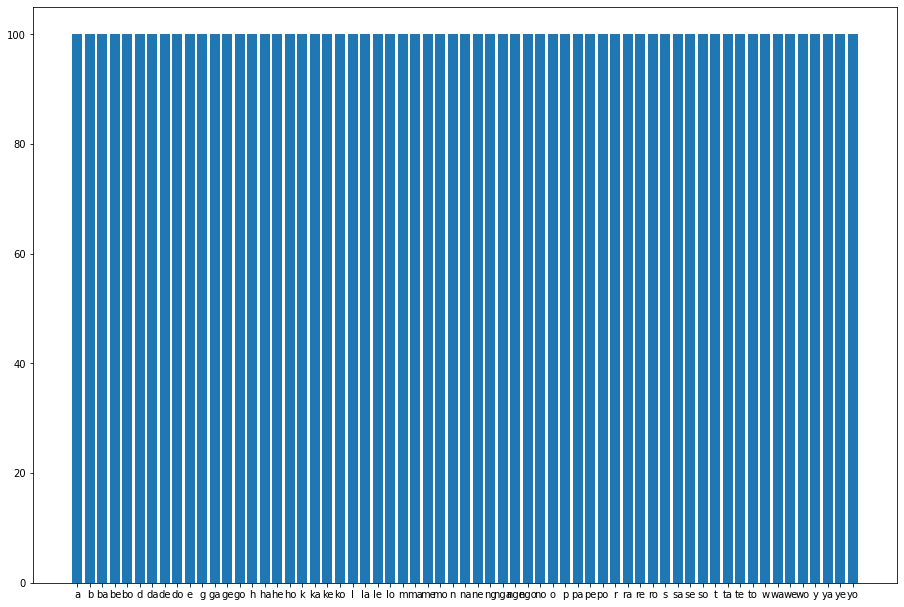

(array(['a', 'b', 'ba', 'be', 'bo', 'd', 'da', 'de', 'do', 'e', 'g', 'ga',
       'ge', 'go', 'h', 'ha', 'he', 'ho', 'k', 'ka', 'ke', 'ko', 'l',
       'la', 'le', 'lo', 'm', 'ma', 'me', 'mo', 'n', 'na', 'ne', 'ng',
       'nga', 'nge', 'ngo', 'no', 'o', 'p', 'pa', 'pe', 'po', 'r', 'ra',
       're', 'ro', 's', 'sa', 'se', 'so', 't', 'ta', 'te', 'to', 'w',
       'wa', 'we', 'wo', 'y', 'ya', 'ye', 'yo'], dtype='<U32'), array([100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100,
       100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100,
       100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100,
       100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100,
       100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100]))


In [37]:
valid_datasize = get_dataset_size(valid_label)

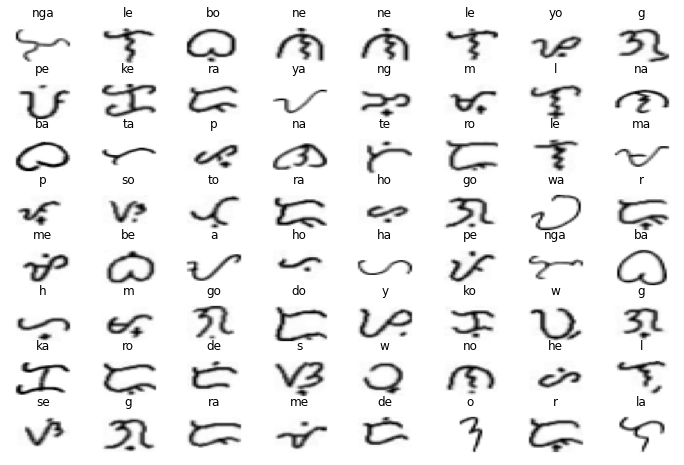

In [38]:
show_dataset_samples(valid_data,valid_label)

#PREPROCESSING

In [39]:
train_data = (255-train_data.astype('float32')) / 255
valid_data = (255-valid_data.astype('float32')) / 255

##Label Coding
Convert class names to int

In [40]:
label_code = []
for i in range(len(train_datasize[0])):
    label_code.append([i,train_datasize[0][i]])
label_code = np.array(label_code)
label_code

array([['0', 'a'],
       ['1', 'b'],
       ['2', 'ba'],
       ['3', 'be'],
       ['4', 'bo'],
       ['5', 'd'],
       ['6', 'da'],
       ['7', 'de'],
       ['8', 'do'],
       ['9', 'e'],
       ['10', 'g'],
       ['11', 'ga'],
       ['12', 'ge'],
       ['13', 'go'],
       ['14', 'h'],
       ['15', 'ha'],
       ['16', 'he'],
       ['17', 'ho'],
       ['18', 'k'],
       ['19', 'ka'],
       ['20', 'ke'],
       ['21', 'ko'],
       ['22', 'l'],
       ['23', 'la'],
       ['24', 'le'],
       ['25', 'lo'],
       ['26', 'm'],
       ['27', 'ma'],
       ['28', 'me'],
       ['29', 'mo'],
       ['30', 'n'],
       ['31', 'na'],
       ['32', 'ne'],
       ['33', 'ng'],
       ['34', 'nga'],
       ['35', 'nge'],
       ['36', 'ngo'],
       ['37', 'no'],
       ['38', 'o'],
       ['39', 'p'],
       ['40', 'pa'],
       ['41', 'pe'],
       ['42', 'po'],
       ['43', 'r'],
       ['44', 'ra'],
       ['45', 're'],
       ['46', 'ro'],
       ['47', 's'],
       ['48',

In [41]:
def label_coding(label,lbl_code=label_code):
    label_coded = []
    for letter in label:
        label_coded.append(lbl_code.T[0][np.where(lbl_code.T[1]==letter)])
    label_coded = np.array(label_coded)

    return label_coded

In [42]:
train_label = label_coding(train_label)
train_label

array([['0'],
       ['0'],
       ['0'],
       ...,
       ['62'],
       ['62'],
       ['62']], dtype='<U21')

In [43]:
train_label_round = train_label

In [44]:
valid_label = label_coding(valid_label)
valid_label

array([['0'],
       ['0'],
       ['0'],
       ...,
       ['62'],
       ['62'],
       ['62']], dtype='<U21')

In [45]:
valid_label_round = valid_label

##One-Hot Coding

In [46]:
import tensorflow.keras as keras
num_classes = len(train_datasize[0])

train_label = keras.utils.to_categorical(train_label, num_classes)
valid_label = keras.utils.to_categorical(valid_label, num_classes)

In [47]:
train_label

array([[1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.]], dtype=float32)

In [48]:
valid_label

array([[1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.]], dtype=float32)

##DATA AUGMENTATION

In [49]:
# Visualize the dataset

import random

def show_dataset_samples_aug(data,labels):
    plt.rcParams['figure.figsize'] = [12, 8]

    count = 8
    fig, ax = plt.subplots(count, count)
    for i in range(count):
        for j in range(count):
            k = random.randint(0,len(labels))
            augmented_image = data_augmentation(tf.expand_dims(data[k], 0))
            ax[i][j].imshow(np.reshape(augmented_image,(IMG_SIZE,IMG_SIZE)), aspect='auto', cmap='gray')
            ax[i][j].title.set_text(label_code.T[1][(int)(labels[k])])
            ax[i][j].axis('off')
    
    plt.show()

    return

In [50]:
data_augmentation = tf.keras.Sequential([
  tf.keras.layers.RandomRotation(0.08),
  tf.keras.layers.RandomTranslation(0.1,0.1,fill_mode='constant'),
  tf.keras.layers.RandomContrast(0.1),
  tf.keras.layers.RandomZoom((-0.05,0.5),width_factor=(-0.05,0.5), fill_mode='constant')
])

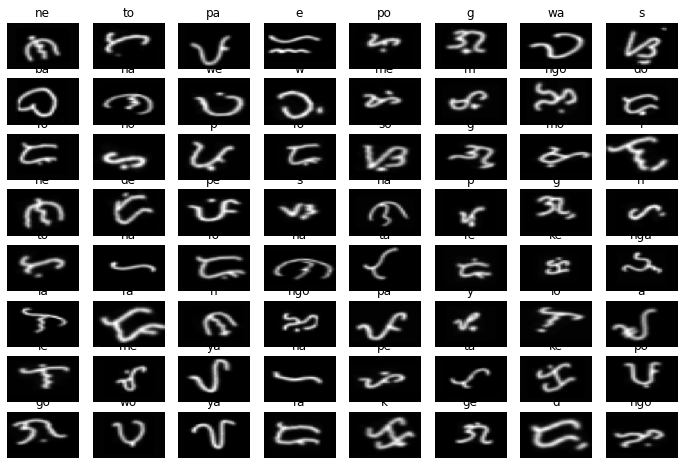

In [51]:
show_dataset_samples_aug(valid_data,valid_label_round)

#MODEL

In [52]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import (
    Dense,
    Conv2D,
    MaxPool2D,
    AveragePooling2D,
    Flatten,
    Dropout,
    BatchNormalization,
    DepthwiseConv2D,
    ReLU
)
from tensorflow.keras import layers
from tensorflow import keras

##MODEL LAYERS

In [53]:
model = Sequential()

model.add(keras.Input(shape=(IMG_SIZE, IMG_SIZE, 1)))

# DATA AUGMENTATION
model.add(layers.RandomZoom((-0.05,0.5),width_factor=(-0.05,0.5), fill_mode='constant'))
model.add(layers.RandomRotation(0.08))
model.add(layers.RandomTranslation(0.1,0.1,fill_mode='constant'))
model.add(layers.RandomContrast(0.1))

# FEATURE EXTRACTION
# CONV => RELU => POOL
model.add(Conv2D(64, (3, 3), strides=1, padding="same", activation="relu"))
model.add(DepthwiseConv2D(3,strides=(2,2),padding ='same', use_bias = False, activation="relu"))
model.add(Conv2D(32, (3, 3), strides=1, padding="same", activation="relu"))
#model.add(Dropout(0.25))
#model.add(MaxPool2D((2, 2), strides=(2, 2), padding="same")) #strides=(x,x) since input is square matrix

# CONV => RELU => POOL
model.add(Conv2D(64, (3, 3), strides=1, padding="same", activation="relu"))
model.add(Conv2D(64, (1, 1), strides=1, padding="same", activation="relu"))
model.add(Conv2D(64, (3, 3), strides=1, padding="same", activation="relu"))
model.add(BatchNormalization())
model.add(Dropout(0.1))
model.add(AveragePooling2D((2, 2), strides=(2, 2), padding="same"))

# CONV => RELU => POOL
model.add(Conv2D(128, (3, 3), strides=1, padding="valid", activation="relu"))
model.add(Conv2D(128, (1, 1), strides=1, padding="valid", activation="relu"))
model.add(Conv2D(128, (3, 3), strides=1, padding="valid", activation="relu"))
model.add(BatchNormalization())
model.add(Dropout(0.15))
#model.add(AveragePooling2D((2, 2), strides=(1, 1), padding="valid"))

# CONV => RELU => POOL
model.add(Conv2D(256, (3, 3), strides=1, padding="valid", activation="relu"))
#model.add(BatchNormalization())
model.add(Dropout(0.1))
model.add(MaxPool2D((2, 2), strides=(2, 2), padding="valid"))

# CLASSIFICATION
# Flatten => RELU layers
model.add(Flatten())
# Hidden Layers
model.add(Dense(units=256, activation="relu"))
model.add(Dropout(0.1))
model.add(Dense(units=512, activation="relu"))
model.add(Dropout(0.15))

# a softmax classifier
model.add(Dense(units=num_classes, activation="softmax"))

In [54]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 random_zoom_1 (RandomZoom)  (None, 32, 32, 1)         0         
                                                                 
 random_rotation_1 (RandomRo  (None, 32, 32, 1)        0         
 tation)                                                         
                                                                 
 random_translation_1 (Rando  (None, 32, 32, 1)        0         
 mTranslation)                                                   
                                                                 
 random_contrast_1 (RandomCo  (None, 32, 32, 1)        0         
 ntrast)                                                         
                                                                 
 conv2d (Conv2D)             (None, 32, 32, 64)        640       
                                                      

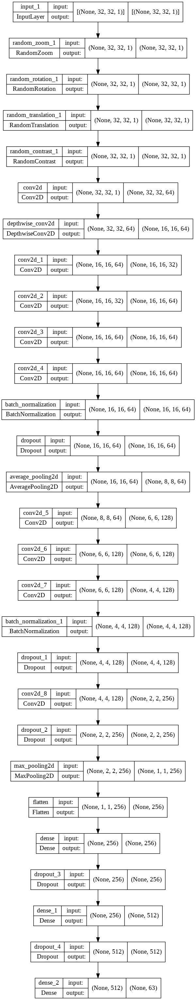

In [55]:
# Visualize the model
from IPython.display import Image
from keras.utils.vis_utils import plot_model

plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True)
Image('model.png')

##Compile Model

In [56]:
# Ask Keras to build the TensorFlow model behind the scenes
base_learning_rate = 0.0001

model.compile(loss="categorical_crossentropy", 
              optimizer=tf.keras.optimizers.RMSprop(learning_rate=base_learning_rate), 
              metrics=["accuracy"])

#TRAINING

In [57]:
# Logging with tensorboard
tensorboard = keras.callbacks.TensorBoard(
    log_dir="./log_directory",
)

In [58]:
# Train the neural network
BATCH_SIZE = 32
NUM_EPOCHS = 50

history = model.fit(train_data, 
          train_label,
          validation_data=(valid_data, valid_label),
          batch_size=BATCH_SIZE,
          epochs=NUM_EPOCHS,
          verbose=1,
          callbacks=[tensorboard])

Epoch 1/50
788/788 [==============================] - 23s 13ms/step - loss: 2.7728 - accuracy: 0.2225 - val_loss: 2.0621 - val_accuracy: 0.3276
Epoch 2/50
788/788 [==============================] - 11s 13ms/step - loss: 1.4913 - accuracy: 0.4866 - val_loss: 1.0539 - val_accuracy: 0.6106
Epoch 3/50
788/788 [==============================] - 9s 11ms/step - loss: 1.0196 - accuracy: 0.6377 - val_loss: 0.7399 - val_accuracy: 0.7349
Epoch 4/50
788/788 [==============================] - 9s 11ms/step - loss: 0.7676 - accuracy: 0.7272 - val_loss: 0.5377 - val_accuracy: 0.8140
Epoch 5/50
788/788 [==============================] - 9s 11ms/step - loss: 0.5922 - accuracy: 0.7928 - val_loss: 0.6582 - val_accuracy: 0.7648
Epoch 6/50
788/788 [==============================] - 9s 12ms/step - loss: 0.5023 - accuracy: 0.8279 - val_loss: 3.2294 - val_accuracy: 0.3475
Epoch 7/50
788/788 [==============================] - 9s 11ms/step - loss: 0.4343 - accuracy: 0.8496 - val_loss: 0.4219 - val_accuracy: 0.86

##TRAINING vs VALIDATION PLOTS

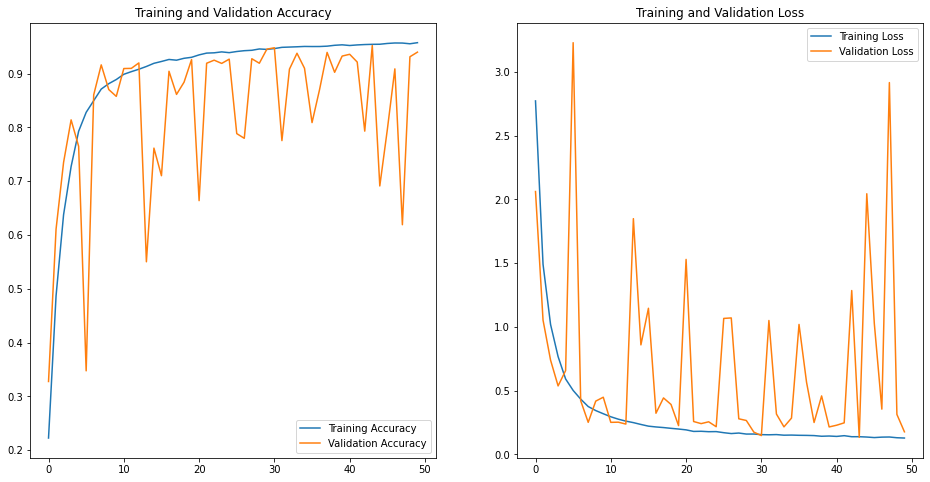

In [59]:
# Plot accuracy and loss with Matplotlib

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(NUM_EPOCHS)

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [60]:
%load_ext tensorboard
%tensorboard --logdir ./log_directory

<IPython.core.display.Javascript object>

#MODEL EVALUATION & PREDICTION

In [61]:
valid_label_round = np.argmax(valid_label, axis=1)

In [62]:
test_metrics = model.evaluate(valid_data, valid_label)

197/197 [==============================] - 1s 4ms/step - loss: 0.1779 - accuracy: 0.9398


##CONFUSION MATRIX

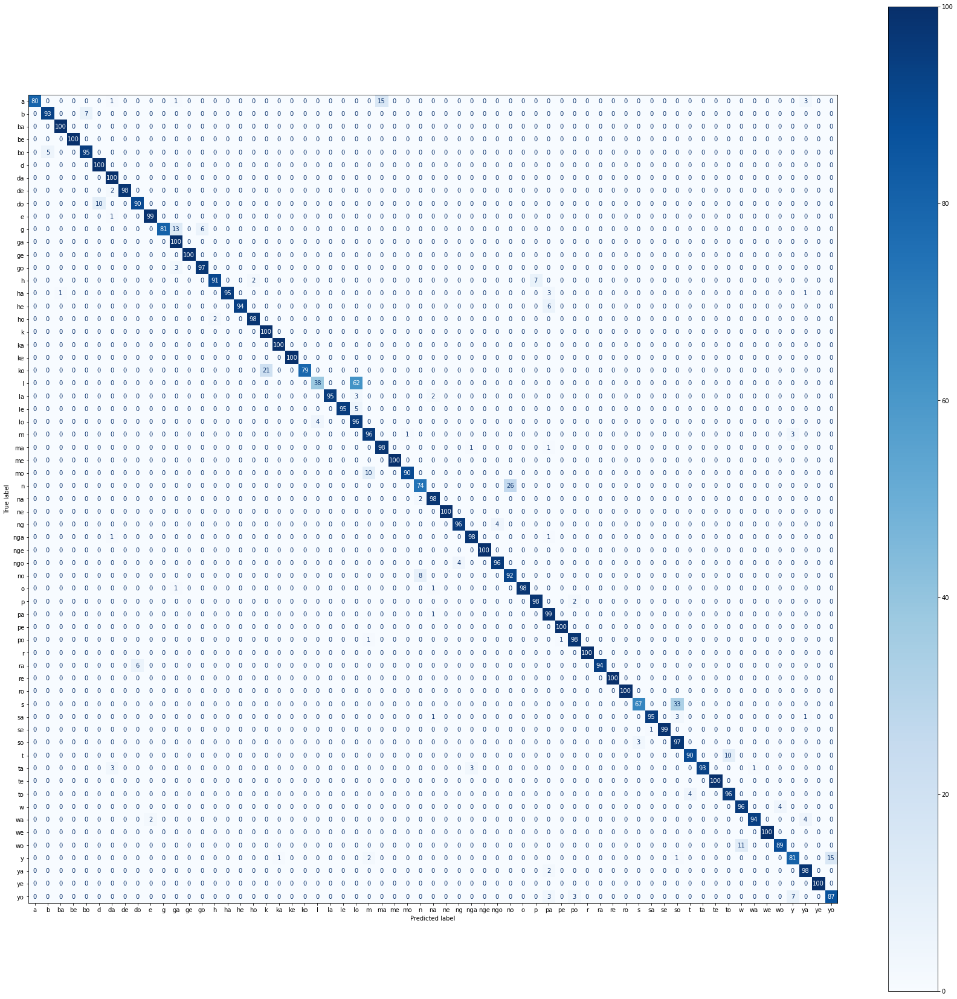

In [63]:
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import confusion_matrix

test_predictions = np.argmax(model.predict(valid_data), axis=1)
cm = confusion_matrix(valid_label_round, test_predictions)
cmp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=label_code.T[1])

fig, ax = plt.subplots(figsize=(30,30))
#for labels in cmp.text_.ravel():
#    labels.set_fontsize(5)
cmp.plot(cmap=plt.cm.Blues,ax=ax)

##CLASSIFICATION REPORT

In [64]:
MODEL_NAME = 'BaybayinChar_ProposedModel_zoomed_MODIFIED_TUNED(256+512Dense)'

In [65]:
from sklearn.metrics import classification_report
import pandas as pd

report = classification_report(valid_label_round, test_predictions, target_names=label_code.T[1],output_dict=True)

clsf_report = pd.DataFrame(report).transpose()
clsf_report.to_csv(MODEL_NAME + '_classification_report.csv', index= True)

clsf_report.head()

,precision,recall,f1-score,support
a,1.000000,0.80,0.888889,100.0
b,0.948980,0.93,0.939394,100.0
ba,0.990099,1.00,0.995025,100.0
be,1.000000,1.00,1.000000,100.0
bo,0.931373,0.95,0.940594,100.0


##SAMPLE TEST

In [66]:
# label mapping

def infer(image_number):
    # image_number - select the image from our test dataset
   
    plt.figure(figsize=(16, 8))
    
    # load the image in an array
    img = valid_data[image_number]

    # display the image
    plt.subplot(1, 2, 1)
    plt.imshow(np.reshape(img,(IMG_SIZE,IMG_SIZE)), cmap='gray')
    plt.colorbar()
    plt.grid(False)
    
    # reshape it
    img_reshape = np.array(img).reshape(1, IMG_SIZE, IMG_SIZE, 1)

    # pass in the network for prediction and
    pred = model.predict(img_reshape)

    x_values = range(num_classes)
    plt.subplot(1, 2, 2)
    plt.bar(x_values, pred.flatten())
    plt.xticks(x_values)  

    # save the predicted label
    predicted_label = label_code.T[1][np.argmax(pred)]
    # load the original label
    true_label = label_code.T[1][int(valid_label_round[image_number])]
    
    # display the result
    print(f"Ground truth: {true_label}; Predicted: {predicted_label}" )

    return

Ground truth: a; Predicted: a


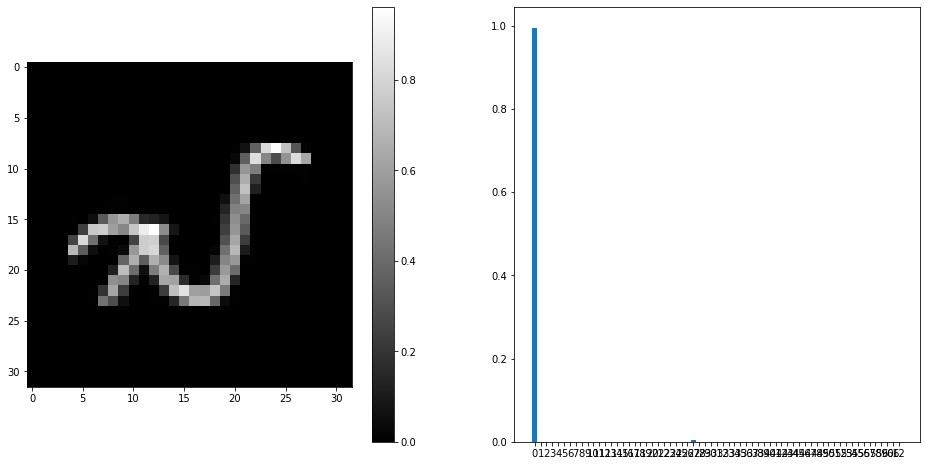

In [67]:
infer(67)

Ground truth: g; Predicted: g


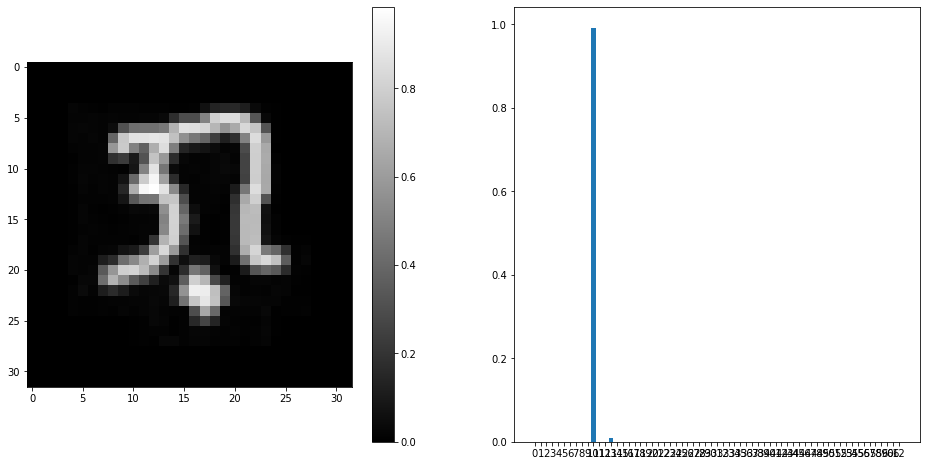

In [68]:
infer(1000)

Ground truth: le; Predicted: le


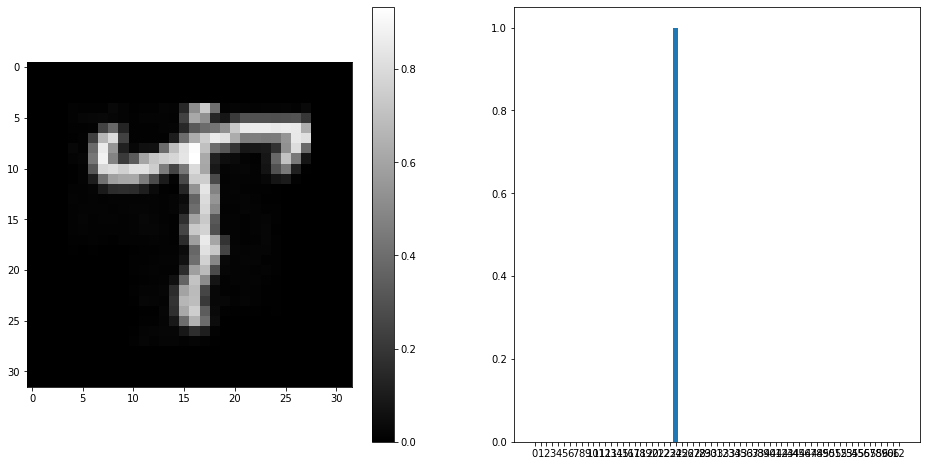

In [69]:
infer(2460)

Ground truth: ngo; Predicted: ngo


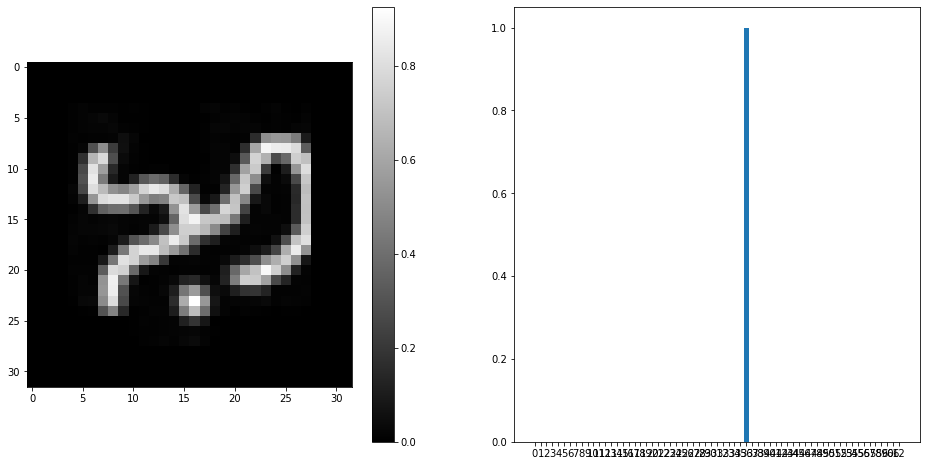

In [70]:
infer(3600)

In [71]:
model.predict(valid_data[0:10])

array([[9.88750994e-01, 1.15788684e-15, 9.40975677e-14, 7.21816861e-17,
        8.76155263e-16, 3.05086389e-19, 7.63493380e-10, 8.97043770e-20,
        1.41920701e-17, 3.76614354e-15, 3.92171511e-15, 1.16184534e-10,
        2.67082024e-22, 1.41914745e-17, 1.03502090e-15, 6.02731230e-14,
        5.50250302e-20, 5.94954883e-15, 1.92868065e-21, 1.00093395e-13,
        1.25644120e-25, 8.48895913e-20, 1.14075563e-11, 3.04400407e-12,
        1.40689745e-22, 3.91923690e-13, 2.05839026e-10, 1.12435240e-02,
        1.09009396e-14, 9.84335724e-10, 2.15280157e-17, 4.08278419e-13,
        6.38740016e-20, 8.79826946e-14, 2.06577866e-08, 1.34967783e-18,
        1.57638258e-16, 2.86466874e-17, 1.52157464e-12, 3.08040843e-16,
        1.64361039e-10, 3.94225459e-20, 1.43151711e-17, 1.51471674e-21,
        2.99954987e-16, 1.48079977e-25, 3.21510685e-21, 4.76009485e-20,
        6.19874811e-13, 8.41345977e-19, 3.15798119e-18, 1.39242840e-14,
        5.84360471e-08, 1.01220086e-18, 3.35146627e-15, 1.375572

#MODEL EXPORT

In [72]:
# Convert Keras model to TF Lite format.
converter = tf.lite.TFLiteConverter.from_keras_model(model)
tflite_model = converter.convert()

tf.lite.experimental.Analyzer.analyze(model_content=tflite_model)

# Print the signatures from the converted model
interpreter = tf.lite.Interpreter(model_content=tflite_model)

signatures = interpreter.get_signature_list()
print(signatures)

# Save the TF Lite model as file
f = open(MODEL_NAME+'_model.tflite', "wb")
f.write(tflite_model)
f.close()

INFO:tensorflow:Assets written to: /tmp/tmp8ns8xro9/assets


=== TFLite ModelAnalyzer ===

Your TFLite model has '1' subgraph(s). In the subgraph description below,
T# represents the Tensor numbers. For example, in Subgraph#0, the CONV_2D op takes
tensor #0 and tensor #22 and tensor #12 as input and produces tensor #32 as output.

Subgraph#0 main(T#0) -> [T#52]
  Op#0 CONV_2D(T#0, T#22, T#12) -> [T#32]
  Op#1 DEPTHWISE_CONV_2D(T#32, T#23, T#21) -> [T#33]
  Op#2 CONV_2D(T#33, T#24, T#11) -> [T#34]
  Op#3 CONV_2D(T#34, T#25, T#10) -> [T#35]
  Op#4 CONV_2D(T#35, T#26, T#9) -> [T#36]
  Op#5 CONV_2D(T#36, T#27, T#8) -> [T#37]
  Op#6 MUL(T#37, T#14) -> [T#38]
  Op#7 ADD(T#38, T#15) -> [T#39]
  Op#8 AVERAGE_POOL_2D(T#39) -> [T#40]
  Op#9 CONV_2D(T#40, T#28, T#7) -> [T#41]
  Op#10 CONV_2D(T#41, T#29, T#6) -> [T#42]
  Op#11 CONV_2D(T#42, T#30, T#5) -> [T#43]
  Op#12 MUL(T#43, T#16) -> [T#44]
  Op#13 ADD(T#44, T#17) -> [T#45]
  Op#14 CONV_2D(T#45, T#31, T#4) -> [T#46]
  Op#15 MAX_POOL_2D(T#46) -> [T#47]
  Op#16 RESHAPE(T#47, T#13) -> [T#48]
  Op#17 FULLY_

In [73]:
from google.colab import files
files.download(MODEL_NAME+'_model.tflite')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>